In [1]:
import sionna as sn
import tensorflow as tf
tf.get_logger().setLevel('ERROR')
import numpy as np
%matplotlib inline
import matplotlib.pyplot as plt
import time
from tensorflow.keras import Model
!pip install scikit-image
!pip install ipdb


# Load the required Sionna components
from sionna.mapping import Constellation, Mapper, Demapper
from sionna.fec.ldpc import LDPC5GEncoder, LDPC5GDecoder, LDPCBPDecoder
from sionna.fec.interleaving import RandomInterleaver, Deinterleaver
from sionna.fec.scrambling import Scrambler, Descrambler
from sionna.fec.utils import GaussianPriorSource, load_parity_check_examples, get_exit_analytic, plot_exit_chart, plot_trajectory
from sionna.utils import BinarySource, ebnodb2no, hard_decisions
from sionna.utils.plotting import PlotBER
from sionna.channel import AWGN

DEPRECATION: Python 2.7 will reach the end of its life on January 1st, 2020. Please upgrade your Python as Python 2.7 won't be maintained after that date. A future version of pip will drop support for Python 2.7. More details about Python 2 support in pip, can be found at https://pip.pypa.io/en/latest/development/release-process/#python-2-support
     |████████████████████████████████| 28.4MB 11.1MB/s eta 0:00:01
  Using cached https://files.pythonhosted.org/packages/b7/6f/24647f014eef9b67a24adfcbcd4f4928349b4a0f8393b3d7fe648d4d2de3/numpy-1.16.6.zip
  Using cached https://files.pythonhosted.org/packages/62/4f/7e95c5000c411164d5ca6f55ac54cda5d200a3b6719dafd215ee0bd61578/scipy-1.2.3.tar.gz
    ERROR: Command errored out with exit status 1:
     command: /Users/athmajanvivekananthan/.pyenv/versions/2.7.18/bin/python2.7 -c 'import sys, setuptools, tokenize; sys.argv[0] = '"'"'/private/var/folders/4s/b7gb8z5553b490xvx_76pv6m0000gn/T/pip-install-02WaMF/scipy/setup.py'"'"'; __file__='"'"'/pri

In [2]:
def image_to_bits(image):
    """
    Convert an image (grayscale or color) to bits for transmission.
    """
    if image.ndim == 3:  # Color image (RGB)
        original_shape = image.shape
        bits = []
        for channel in range(3):  # Process R, G, B channels separately
            channel_bits = np.unpackbits(image[:, :, channel].flatten())
            bits.append(channel_bits)
        bits = np.concatenate(bits)  # Combine all channels
    else:  # Grayscale image
        original_shape = image.shape
        bits = np.unpackbits(image.flatten())
    return tf.convert_to_tensor(bits, dtype=tf.float32), original_shape

def bits_to_image(bits, original_shape):
    """
    Convert bits back to an image (grayscale or color).
    """
    bits = np.array(bits, dtype=np.uint8)  # Convert to numpy array
    pixels = np.packbits(bits)  # Convert bits to pixel values
    
    if len(original_shape) == 3:  # Color image (RGB)
        channel_size = original_shape[0] * original_shape[1]
        channels = []
        for channel in range(3):  # Separate channels
            start = channel * channel_size
            end = (channel + 1) * channel_size
            channels.append(pixels[start:end].reshape(original_shape[:2]))
        image = np.stack(channels, axis=-1)  # Combine channels
    else:  # Grayscale image
        image = pixels.reshape(original_shape)
    return image

def sendImg(channelModel, image, ebno_db,block_length=1024):
        """
        Transmit an image (grayscale or color) over the AWGN channel.
        """
        bits, original_shape = image_to_bits(image)
        batch_size = bits.shape[0] // block_length
        #import ipdb; ipdb.set_trace()
        bits = tf.reshape(bits, [batch_size, block_length])

        no = sn.utils.ebnodb2no(ebno_db,
                                num_bits_per_symbol=channelModel.num_bits_per_symbol,
                                coderate=1.0)

        x = channelModel.mapper(bits)
        #import ipdb; ipdb.set_trace()
        y = channelModel.awgn_channel([x, no])
        llr = channelModel.demapper([y, no])
        
        # Decode LLRs to bits using a threshold of 0
        received_bits = tf.cast(llr > 0, tf.float32)  # Threshold > 0 for binary inversion
        received_bits = tf.reshape(received_bits, [-1])
        
        received_image = bits_to_image(received_bits, original_shape)
        return received_image


def plot_demapped_llr_distribution(channelModel, ebno_db):
            
    
        # simulation parameters
        batch_size = int(1e6) # number of symbols to be analyzed
        
        # calculate noise var for given Eb/No (no code used at the moment)
        no = ebnodb2no(ebno_db, channelModel.num_bits_per_symbol, coderate=1)
        
        # and generate bins for the histogram
        llr_bins = np.arange(-20,20,0.1)
        
        # Binary source that generates random 0s/1s
        b = channelModel.binary_source([batch_size, channelModel.num_bits_per_symbol])
        
        # init mapper, channel and demapper
        x = channelModel.mapper(b)
        y = channelModel.awgn_channel([x, no])
        llr = channelModel.demapper([y, no])

               
        
        # we flip the sign of all LLRs where b_i=0
        # this ensures that all positive LLRs mark correct decisions
        # all negative LLR values would lead to erroneous decisions
        llr_b = tf.multiply(llr, (2.*b-1.))
        
        # calculate LLR distribution for all bit-channels individually
        llr_dist = []
        for i in range(channelModel.num_bits_per_symbol):
        
            llr_np = tf.reshape(llr_b[:,i],[-1]).numpy()
            t, _ = np.histogram(llr_np, bins=llr_bins, density=True);
            llr_dist.append(t)
        
        # and plot the results
        plt.figure(figsize=(20,8))
        plt.xticks(fontsize=18)
        plt.yticks(fontsize=18)
        plt.grid(which="both")
        plt.xlabel("LLR value", fontsize=25)
        plt.ylabel("Probability density", fontsize=25)
        for idx, llr_hist in enumerate(llr_dist):
            leg_str = f"bit_channel {idx} (SC)".format()
            plt.plot(llr_bins[:-1], llr_hist, label=leg_str)
        if channelModel.num_bits_per_symbol == 2:
            plt.title(f"LLR distribution after demapping (QPSK / AWGN) EBNO {ebno_db}", fontsize=25)
        else:
            plt.title(f"LLR distribution after demapping ({2**channelModel.num_bits_per_symbol}-QAM / AWGN)", fontsize=25)
        plt.legend(fontsize=20);

def get_channel_out_constellation(channelModel,batch_size, ebno_db):
        
        # no channel coding used; we set coderate=1.0
        no = sn.utils.ebnodb2no(ebno_db,
                                num_bits_per_symbol=self.num_bits_per_symbol,
                                coderate=1.0)
    
        bits = channelModel.binary_source([batch_size, channelModel.block_length]) # Blocklength set to 1024 bits
        x = channelModel.mapper(bits)
        y = channelModel.awgn_channel([x, no])
        llr = channelModel.demapper([y,no])
        plt.figure(figsize=(8,8))
        plt.axes().set_aspect(1)
        plt.grid(True)
        plt.title('Channel output')
        plt.xlabel('Real Part')
        plt.ylabel('Imaginary Part')
        plt.scatter(tf.math.real(y), tf.math.imag(y))
        plt.tight_layout()

def runMonteCarlo(channelModel,ebno_min,ebno_max,batch_s):
        #EBN0_DB_MIN = -3.0 # Minimum value of Eb/N0 [dB] for simulations
        #EBN0_DB_MAX = 5.0 # Maximum value of Eb/N0 [dB] for simulations
        #BATCH_SIZE = 2000 # How many examples are processed by Sionna in parallel
        
        ber_plots = sn.utils.PlotBER("AWGN")
        ber_plots.simulate(channelModel,
                          ebno_dbs=np.linspace(ebno_min, ebno_max, 20),
                          batch_size=batch_s,
                          num_target_block_errors=100, # simulate until 100 block errors occured
                          legend="Uncoded",
                          soft_estimates=True,
                          max_mc_iter=100, # run 100 Monte-Carlo simulations (each with batch_size samples)
                          show_fig=True);
        return

def plotTrasmittedImage(channelModel, ebno_db):
    from skimage import data
    # Grayscale images
    # image = data.moon()       # Image of the moon
    # image = data.coins()      # Image of coins
    # image = data.text()       # Text image
    # image = data.camera()     # Default camera image
    
    # Color images
    image = data.astronaut()   # Image of an astronaut
    # image = data.chelsea()    # Image of a cat
    # image = data.coffee()     # Coffee cup image
    received_image = sendImg(channelModel, image, ebno_db)
    
    
    # Visualize the original and received images
    plt.figure(figsize=(12, 6))
    plt.subplot(1, 2, 1)
    plt.title("Original Image")
    plt.imshow(image)
    plt.axis('off')
    
    plt.subplot(1, 2, 2)
    plt.title("Received Image")
    plt.imshow(received_image.astype(np.uint8))  # Ensure correct dtype
    plt.axis('off')
    
    plt.show()

In [3]:
class CodedSystemAWGN(Model): # Inherits from Keras Model
    def __init__(self, num_bits_per_symbol, n, coderate):
        super().__init__() # Must call the Keras model initializer

        self.num_bits_per_symbol = num_bits_per_symbol
        self.n = n
        self.k = int(n*coderate)
        self.coderate = coderate
        self.constellation = sn.mapping.Constellation("qam", self.num_bits_per_symbol)

        self.mapper = sn.mapping.Mapper(constellation=self.constellation)
        self.demapper = sn.mapping.Demapper("app", constellation=self.constellation)

        self.binary_source = sn.utils.BinarySource()
        self.awgn_channel = sn.channel.AWGN()

        self.encoder = sn.fec.ldpc.LDPC5GEncoder(self.k, self.n)
        self.decoder = sn.fec.ldpc.LDPC5GDecoder(self.encoder, hard_out=True)

    #@tf.function # activate graph execution to speed things up
    def __call__(self, batch_size, ebno_db):
        no = sn.utils.ebnodb2no(ebno_db, num_bits_per_symbol=self.num_bits_per_symbol, coderate=self.coderate)

        bits = self.binary_source([batch_size, self.k])
        codewords = self.encoder(bits)
        x = self.mapper(codewords)
        y = self.awgn_channel([x, no])
        llr = self.demapper([y,no])
        bits_hat = self.decoder(llr)
        return bits, bits_hat

In [4]:
# Create an instance of the system (for example, 16-QAM)
num_bits_per_symbol = 4  # 16-QAM (4 bits per symbol)
n = 1000  # Codeword length
coderate = 1/2  # Example code rate

system = CodedSystemAWGN(num_bits_per_symbol, n, coderate)

# Now, plot the constellation
system.plot_constellation()

AttributeError: 'CodedSystemAWGN' object has no attribute 'plot_constellation'

<h3>QPSK</h3>

EbNo [dB] |        BER |       BLER |  bit errors |    num bits | block errors |  num blocks | runtime [s] |    status
---------------------------------------------------------------------------------------------------------------------------------------
     -5.0 | 3.2607e-01 | 1.0000e+00 |      667792 |     2048000 |         2000 |        2000 |         2.9 |reached target block errors
   -3.571 | 2.9369e-01 | 1.0000e+00 |      601483 |     2048000 |         2000 |        2000 |         2.9 |reached target block errors
   -2.143 | 2.5597e-01 | 1.0000e+00 |      524231 |     2048000 |         2000 |        2000 |         2.8 |reached target block errors
   -0.714 | 2.0341e-01 | 1.0000e+00 |      416576 |     2048000 |         2000 |        2000 |         3.1 |reached target block errors
    0.714 | 6.2432e-02 | 8.5850e-01 |      127861 |     2048000 |         1717 |        2000 |         2.8 |reached target block errors
    2.143 | 0.0000e+00 | 0.0000e+00 |           0 |    30720000 |

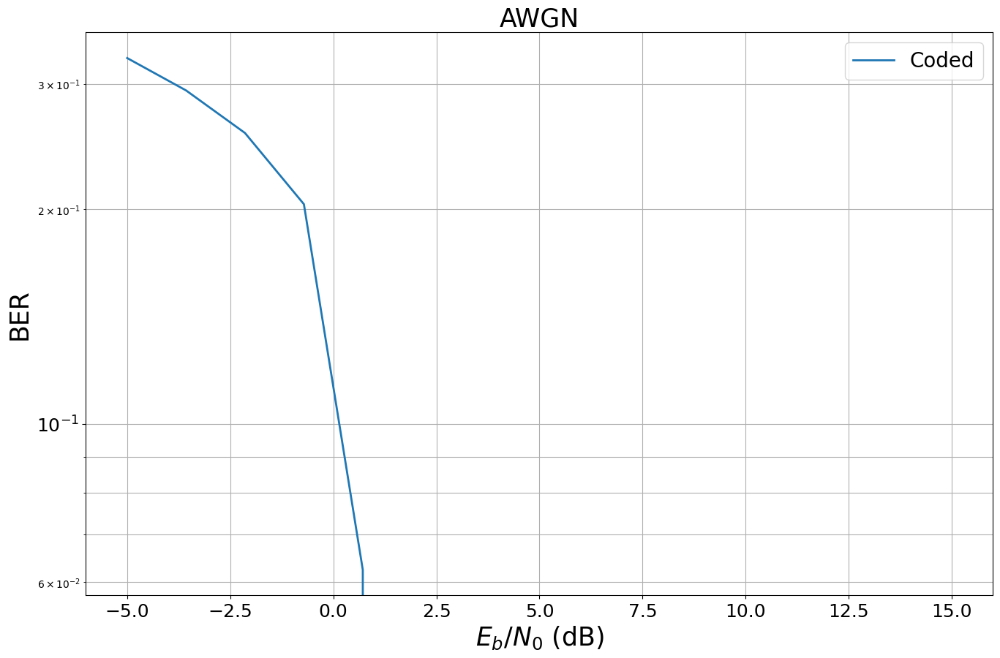

In [15]:
CODERATE = 0.5
BATCH_SIZE = 2000
NUM_BITS_PER_SYMBOL = 2
EBN0_DB_MIN = -5
EBN0_DB_MAX = 15
model_coded_awgn_qpsk = CodedSystemAWGN(num_bits_per_symbol=NUM_BITS_PER_SYMBOL,
                                   n=2048,
                                   coderate=CODERATE)
ber_plots = sn.utils.PlotBER("AWGN")
ber_plots.simulate(model_coded_awgn_qpsk,
                   ebno_dbs=np.linspace(EBN0_DB_MIN, EBN0_DB_MAX, 15),
                   batch_size=BATCH_SIZE,
                   num_target_block_errors=500,
                   legend="Coded",
                   soft_estimates=False,
                   max_mc_iter=15,
                   show_fig=True,
                   forward_keyboard_interrupt=False);

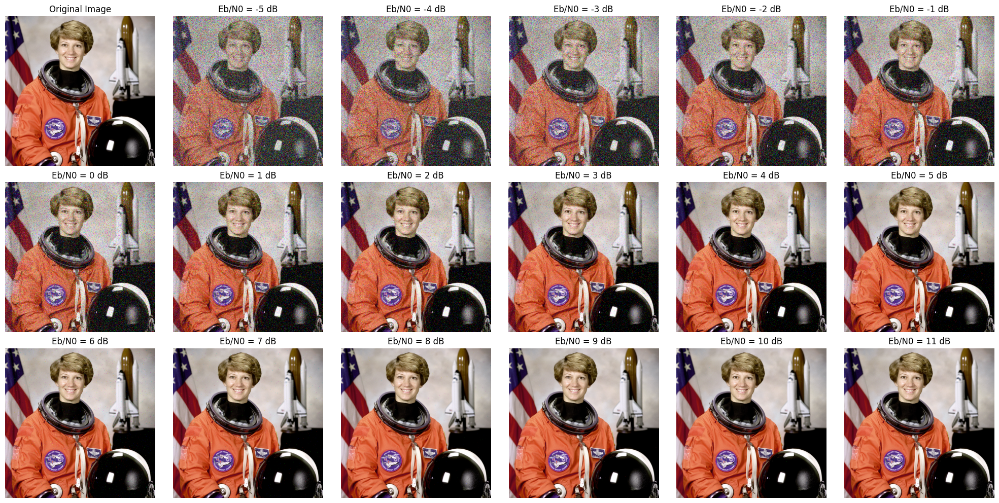

In [22]:
import matplotlib.pyplot as plt
from skimage import data

# Define the range of Eb/N0 values
ebno_range = range(-5, 12)

# Original image
original_image = data.astronaut()

# Initialize a figure with a grid layout
fig, axes = plt.subplots(3, 6, figsize=(20, 10))  # Adjust rows/columns as necessary
axes = axes.flatten()

# Plot the original image
axes[0].imshow(original_image)
axes[0].set_title("Original Image")
axes[0].axis('off')

# Generate and plot received images for each Eb/N0
for i, ebno_db in enumerate(ebno_range):
    received_image = sendImg(model_coded_awgn_qpsk, original_image, ebno_db)
    ax = axes[i + 1]  # Skip the first axis for the original image
    ax.imshow(received_image.astype(np.uint8))
    ax.set_title(f"Eb/N0 = {ebno_db} dB")
    ax.axis('off')

# Hide unused axes if there are any
for ax in axes[len(ebno_range) + 1:]:
    ax.axis('off')

# Adjust layout
plt.tight_layout()
plt.show()


<h3>16QAM</h3>

EbNo [dB] |        BER |       BLER |  bit errors |    num bits | block errors |  num blocks | runtime [s] |    status
---------------------------------------------------------------------------------------------------------------------------------------
     -5.0 | 3.5893e-01 | 1.0000e+00 |      735096 |     2048000 |         2000 |        2000 |         3.0 |reached target block errors
   -3.571 | 3.3256e-01 | 1.0000e+00 |      681081 |     2048000 |         2000 |        2000 |         2.9 |reached target block errors
   -2.143 | 3.0210e-01 | 1.0000e+00 |      618698 |     2048000 |         2000 |        2000 |         3.0 |reached target block errors
   -0.714 | 2.6758e-01 | 1.0000e+00 |      547994 |     2048000 |         2000 |        2000 |         3.1 |reached target block errors
    0.714 | 2.2645e-01 | 1.0000e+00 |      463771 |     2048000 |         2000 |        2000 |         2.9 |reached target block errors
    2.143 | 1.6289e-01 | 1.0000e+00 |      333590 |     2048000 |

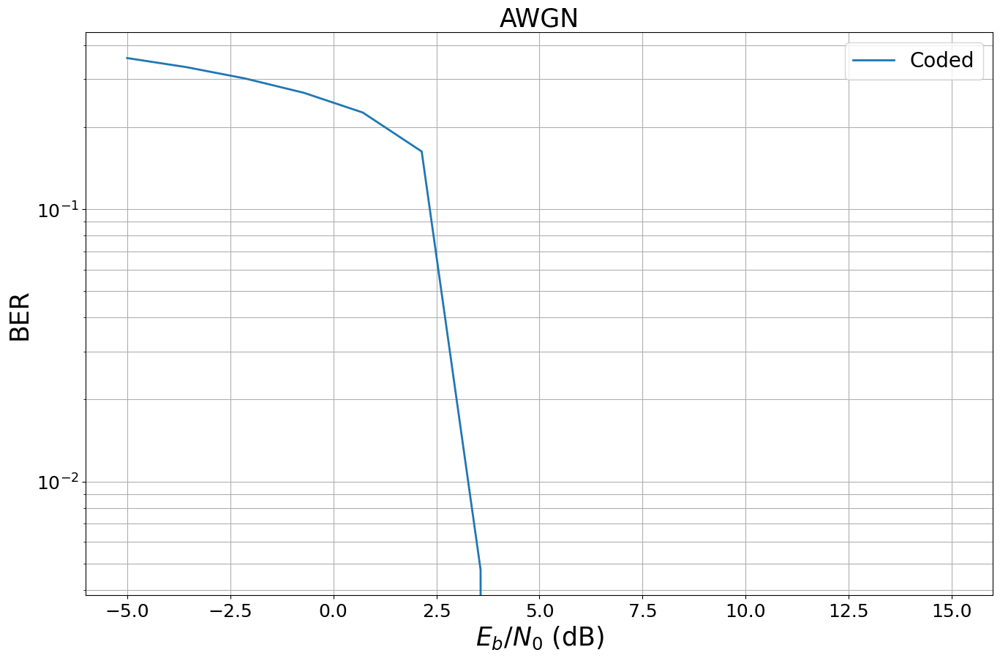

In [23]:
CODERATE = 0.5
BATCH_SIZE = 2000
NUM_BITS_PER_SYMBOL = 4
EBN0_DB_MIN = -5
EBN0_DB_MAX = 15
model_coded_awgn_16qam = CodedSystemAWGN(num_bits_per_symbol=NUM_BITS_PER_SYMBOL,
                                   n=2048,
                                   coderate=CODERATE)
ber_plots = sn.utils.PlotBER("AWGN")
ber_plots.simulate(model_coded_awgn_16qam,
                   ebno_dbs=np.linspace(EBN0_DB_MIN, EBN0_DB_MAX, 15),
                   batch_size=BATCH_SIZE,
                   num_target_block_errors=500,
                   legend="Coded",
                   soft_estimates=False,
                   max_mc_iter=15,
                   show_fig=True,
                   forward_keyboard_interrupt=False);

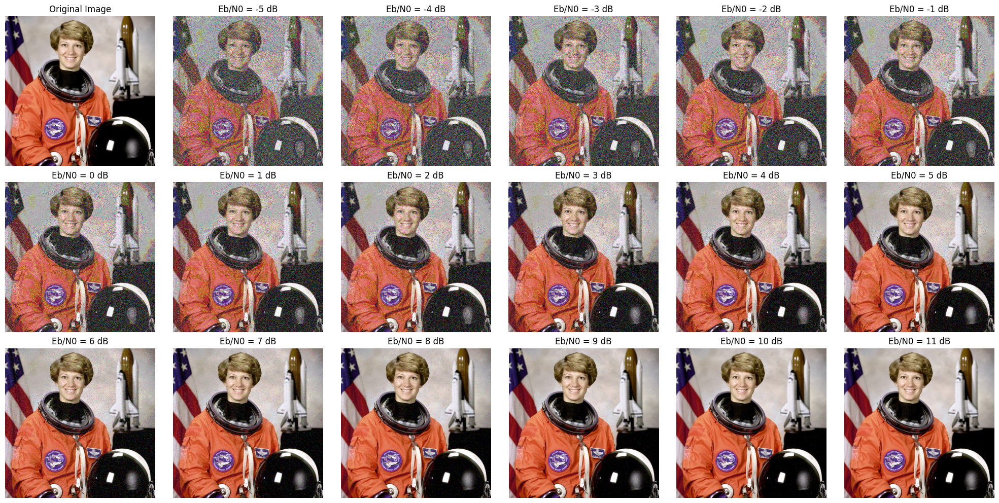

In [24]:
import matplotlib.pyplot as plt
from skimage import data

# Define the range of Eb/N0 values
ebno_range = range(-5, 12)

# Original image
original_image = data.astronaut()

# Initialize a figure with a grid layout
fig, axes = plt.subplots(3, 6, figsize=(20, 10))  # Adjust rows/columns as necessary
axes = axes.flatten()

# Plot the original image
axes[0].imshow(original_image)
axes[0].set_title("Original Image")
axes[0].axis('off')

# Generate and plot received images for each Eb/N0
for i, ebno_db in enumerate(ebno_range):
    received_image = sendImg(model_coded_awgn_16qam, original_image, ebno_db)
    ax = axes[i + 1]  # Skip the first axis for the original image
    ax.imshow(received_image.astype(np.uint8))
    ax.set_title(f"Eb/N0 = {ebno_db} dB")
    ax.axis('off')

# Hide unused axes if there are any
for ax in axes[len(ebno_range) + 1:]:
    ax.axis('off')

# Adjust layout
plt.tight_layout()
plt.show()


<h3>64QAM</h3>

EbNo [dB] |        BER |       BLER |  bit errors |    num bits | block errors |  num blocks | runtime [s] |    status
---------------------------------------------------------------------------------------------------------------------------------------
     -5.0 | 3.9070e-01 | 1.0000e+00 |      338734 |      867000 |         1700 |        1700 |         1.8 |reached target block errors
   -3.571 | 3.7278e-01 | 1.0000e+00 |      323198 |      867000 |         1700 |        1700 |         1.8 |reached target block errors
   -2.143 | 3.5230e-01 | 1.0000e+00 |      305443 |      867000 |         1700 |        1700 |         1.7 |reached target block errors
   -0.714 | 3.2699e-01 | 1.0000e+00 |      283496 |      867000 |         1700 |        1700 |         2.0 |reached target block errors
    0.714 | 2.9800e-01 | 1.0000e+00 |      258365 |      867000 |         1700 |        1700 |         1.7 |reached target block errors
    2.143 | 2.6304e-01 | 1.0000e+00 |      228054 |      867000 |

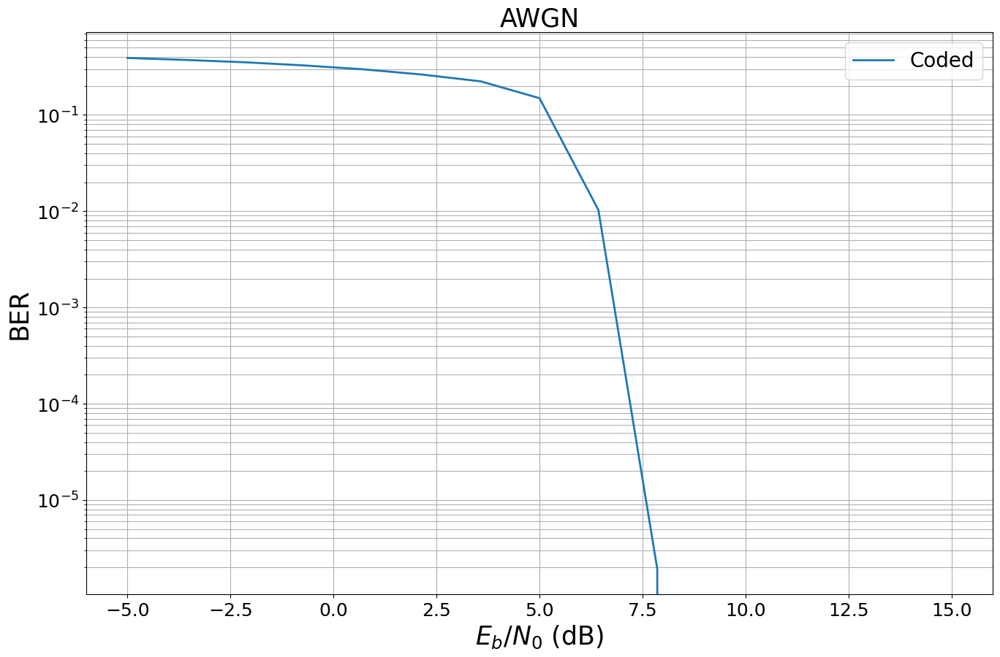

In [26]:


CODERATE = 0.5
BATCH_SIZE = 1700
NUM_BITS_PER_SYMBOL = 6
EBN0_DB_MIN = -5
EBN0_DB_MAX = 15
model_coded_awgn_64qam = CodedSystemAWGN(num_bits_per_symbol=NUM_BITS_PER_SYMBOL,
                                   n=1020,
                                   coderate=CODERATE)
ber_plots = sn.utils.PlotBER("AWGN")
ber_plots.simulate(model_coded_awgn_64qam,
                   ebno_dbs=np.linspace(EBN0_DB_MIN, EBN0_DB_MAX, 15),
                   batch_size=BATCH_SIZE,
                   num_target_block_errors=500,
                   legend="Coded",
                   soft_estimates=False,
                   max_mc_iter=15,
                   show_fig=True,
                   forward_keyboard_interrupt=False);


InvalidArgumentError: {{function_node __wrapped__Reshape_device_/job:localhost/replica:0/task:0/device:CPU:0}} Input to reshape is a tensor with 6292380 values, but the requested shape has 1020 [Op:Reshape]

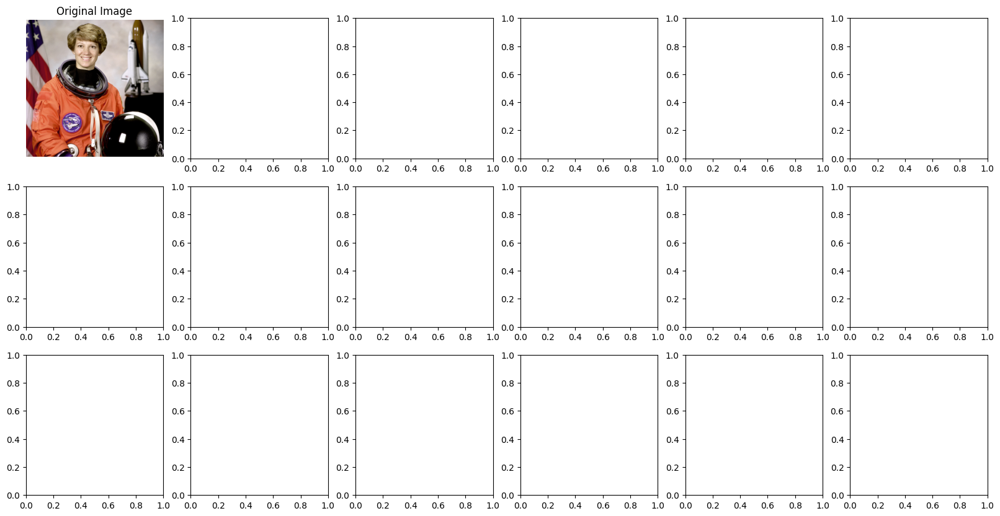

In [30]:

CODERATE = 0.5
BATCH_SIZE = 1700
NUM_BITS_PER_SYMBOL = 6
EBN0_DB_MIN = -5
EBN0_DB_MAX = 15
model_coded_awgn_64qam = CodedSystemAWGN(num_bits_per_symbol=NUM_BITS_PER_SYMBOL,
                                   n=6169,
                                   coderate=CODERATE)




def sendImg_64(channelModel, image, ebno_db,batch_size,block_length = 1020 ):
        """
        Transmit an image (grayscale or color) over the AWGN channel.
        """
    
        bits, original_shape = image_to_bits(image)
        parityCheckVal = ((bits.shape[0]//block_length) +1)*block_length - bits.shape[0]
        dummy_bits = tf.zeros([parityCheckVal], dtype=bits.dtype)
        
        padded_bits = tf.concat([bits, dummy_bits], axis=0)
        bits = padded_bits
        #batch_size = bits.shape[0] // channelModel.block_length
        #import ipdb; ipdb.set_trace()
        bits = tf.reshape(bits, [batch_size, block_length])

        no = sn.utils.ebnodb2no(ebno_db,
                                num_bits_per_symbol=channelModel.num_bits_per_symbol,
                                coderate=1.0)

        x = channelModel.mapper(bits)
        #import ipdb; ipdb.set_trace()
        y = channelModel.awgn_channel([x, no])
        llr = channelModel.demapper([y, no])
        
        # Decode LLRs to bits using a threshold of 0
        received_bits = tf.cast(llr > 0, tf.float32)  # Threshold > 0 for binary inversion
        received_bits = tf.reshape(received_bits, [-1])
        
        received_image = bits_to_image(received_bits, original_shape)
        return received_image


import matplotlib.pyplot as plt
from skimage import data

# Define the range of Eb/N0 values
ebno_range = range(-5, 12)

# Original image
original_image = data.astronaut()

# Initialize a figure with a grid layout
fig, axes = plt.subplots(3, 6, figsize=(20, 10))  # Adjust rows/columns as necessary
axes = axes.flatten()

# Plot the original image
axes[0].imshow(original_image)
axes[0].set_title("Original Image")
axes[0].axis('off')

# Generate and plot received images for each Eb/N0
for i, ebno_db in enumerate(ebno_range):
    received_image = sendImg_64(model_coded_awgn_64qam, original_image, ebno_db,batch_size)
    ax = axes[i + 1]  # Skip the first axis for the original image
    ax.imshow(received_image.astype(np.uint8))
    ax.set_title(f"Eb/N0 = {ebno_db} dB")
    ax.axis('off')

# Hide unused axes if there are any
for ax in axes[len(ebno_range) + 1:]:
    ax.axis('off')

# Adjust layout
plt.tight_layout()
plt.show()
